In [29]:
# Parameters
notebook_fname = "NN_full_RepeatedKFold_v3_BO_test"

In [30]:
import sys
sys.path.append("../CCA_representation_ML/")


In [31]:
import os
current_directory = os.getcwd()
print("Current directory:", current_directory)


Current directory: /nethome/home3/yuxiang.wu/CCA_CALPHAD_SSS_ML/v6_A-B-C-D-E_Sputtering_ML


In [32]:
import os
import tensorflow as tf
import numpy as np
import pandas as pd

# import warnings
# warnings.filterwarnings("ignore")
tf.compat.v1.logging.set_verbosity(tf.compat.v1.logging.ERROR)
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '2'  # or any {'0', '1', '2'}

print(f'cpu_count: {os.cpu_count()}')

# Data Path
data_path = '../CCA_representation_ML/01_Dataset_Cleaned/'
if os.path.isfile(data_path+'LiteratureDataset_Corrosion_YW_v3_processed.xlsx'):
    print(f"Folder '{data_path}' found.")
else:
    print(f"Warning: File '{data_path}' not found!")

data_path_KW = './v6_A-B-C-D-E_Sputtering_ML_KW/'
data_path_All = './v6_A-B-C-D-E_Sputtering_ML_All/'

absolute_directory = os.path.abspath(data_path_KW)
print("Absolute directory:", absolute_directory)

# Model Path
model_path = '../CCA_representation_ML/04_Model_Saved/'
model_path_bo = f'{model_path}{notebook_fname}/'

# Cleaning up previous tensorflow sessions
tf.keras.backend.clear_session()


cpu_count: 40
Folder '../CCA_representation_ML/01_Dataset_Cleaned/' found.
Absolute directory: /nethome/home3/yuxiang.wu/CCA_CALPHAD_SSS_ML/v6_A-B-C-D-E_Sputtering_ML/v6_A-B-C-D-E_Sputtering_ML_KW


## functionality control


In [33]:
# Use GPU or not
os.environ['CUDA_VISIBLE_DEVICES'] = '-1'
print('not using GPU')

not using GPU


## Evaluate the training results

- Show the model.h5 files in this directory
- Load scalers


In [34]:
import pickle
from utils.postprocessing_evalutation import display_saved_models

display_saved_models(model_path_bo)

# Load the scalers dictionary from a file using pickle
with open(data_path + 'scalers.pkl', 'rb') as f:
    scalers = pickle.load(f)
    print("")
print(scalers)

NNH_model                      NNC_model
-----------------------------  -----------------------------
NNH_model_RepeatedKFold_1.h5   NNC_model_RepeatedKFold_1.h5
NNH_model_RepeatedKFold_2.h5   NNC_model_RepeatedKFold_2.h5
NNH_model_RepeatedKFold_3.h5   NNC_model_RepeatedKFold_3.h5
NNH_model_RepeatedKFold_4.h5   NNC_model_RepeatedKFold_4.h5
NNH_model_RepeatedKFold_5.h5   NNC_model_RepeatedKFold_5.h5
NNH_model_RepeatedKFold_6.h5   NNC_model_RepeatedKFold_6.h5
NNH_model_RepeatedKFold_7.h5   NNC_model_RepeatedKFold_7.h5
NNH_model_RepeatedKFold_8.h5   NNC_model_RepeatedKFold_8.h5
NNH_model_RepeatedKFold_9.h5   NNC_model_RepeatedKFold_9.h5
NNH_model_RepeatedKFold_10.h5  NNC_model_RepeatedKFold_10.h5
NNH_model_RepeatedKFold_11.h5  NNC_model_RepeatedKFold_11.h5
NNH_model_RepeatedKFold_12.h5  NNC_model_RepeatedKFold_12.h5

{'compo': MinMaxScaler(), 'H_specific_testing': MinMaxScaler(), 'C_specific_testing': MinMaxScaler(), 'specific_features': MinMaxScaler(), 'H_output': MinMaxScaler(), 'C_outp

## Predict based on new data inputs


### coordinates for PVD alloy representation


In [35]:
# load the wafer-coordinates
df_PVD_x_y = pd.read_excel(data_path + 'PVD_x_y.xlsx')
coord_x = df_PVD_x_y["x"].to_numpy(dtype=float)
coord_y = df_PVD_x_y["y"].to_numpy(dtype=float)
index_PVD_x_y = df_PVD_x_y.index.values+1

### Make prediction for new alloys

- NiCrCoVFe_KW99
- NiCrMoTiFe_KW131


Processing:   0%|          | 0/2 [00:00<?, ?it/s]

['Ni', 'Cr', 'Co', 'V', 'Fe']
KW99


Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'NoneType' object has no attribute '__dict__'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'NoneType' object has no attribute '__dict__'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'NoneType' object has no attribute '__dict__'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosi

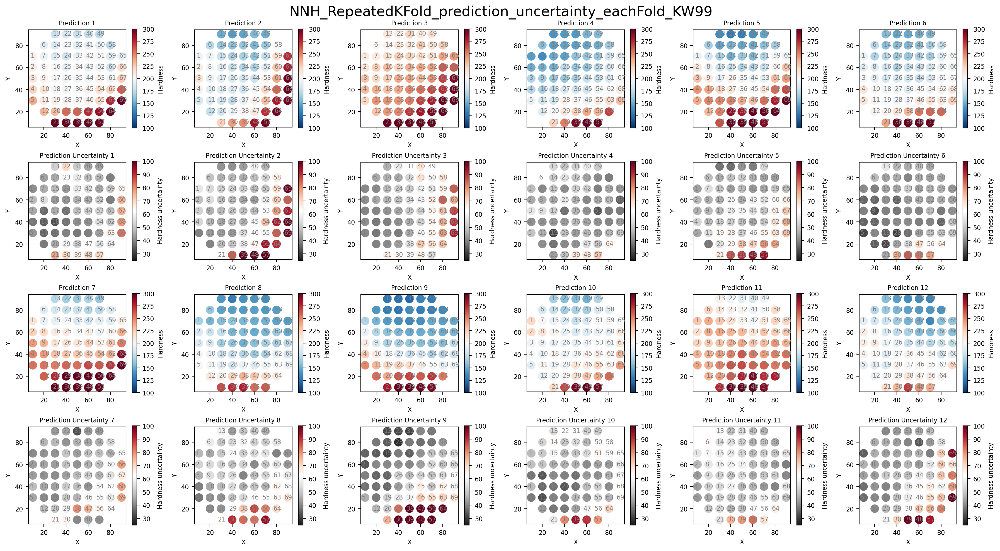

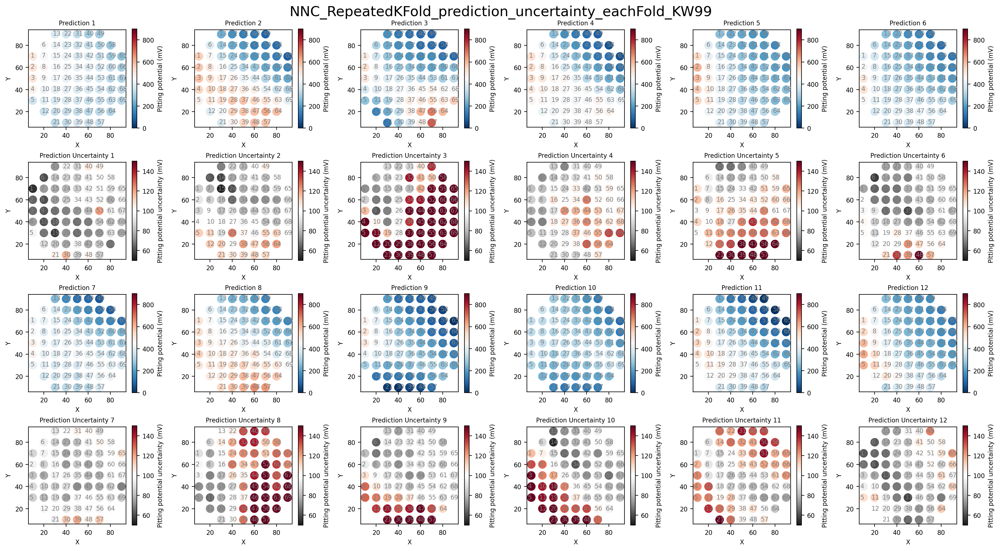

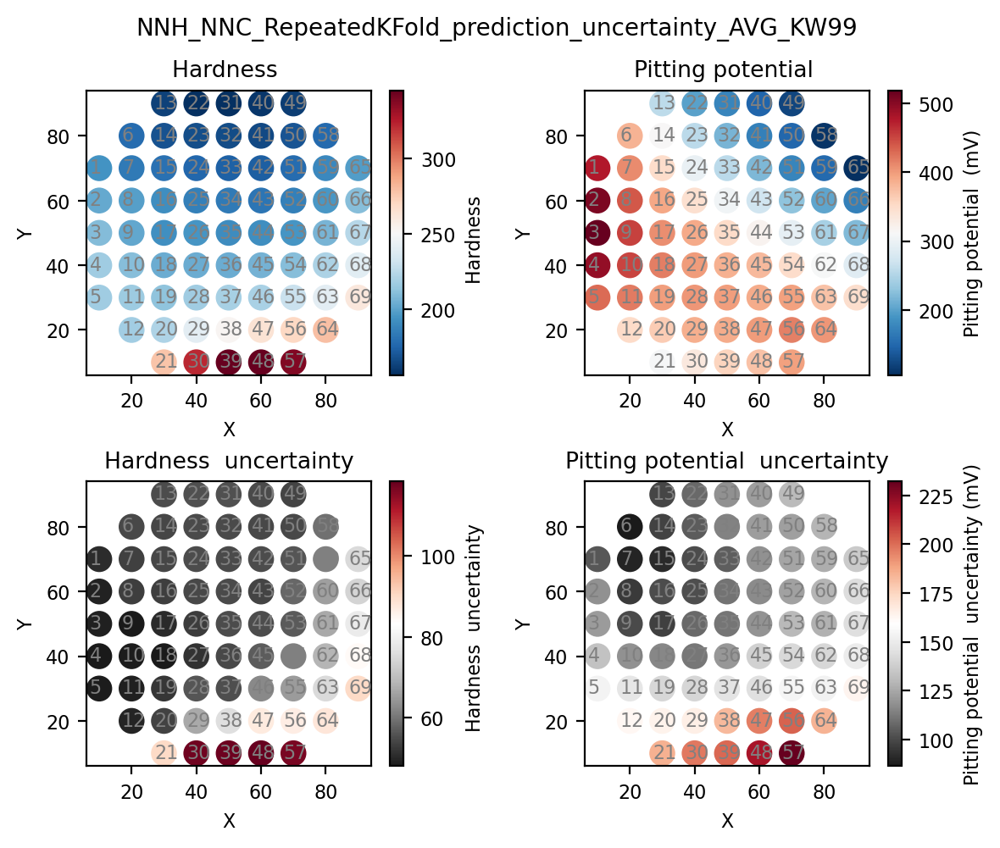

Processing:  50%|█████     | 1/2 [01:03<01:03, 63.55s/it]

['Ni', 'Cr', 'Mo', 'Ti', 'Fe']
KW131


Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'NoneType' object has no attribute '__dict__'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'NoneType' object has no attribute '__dict__'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'NoneType' object has no attribute '__dict__'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosi

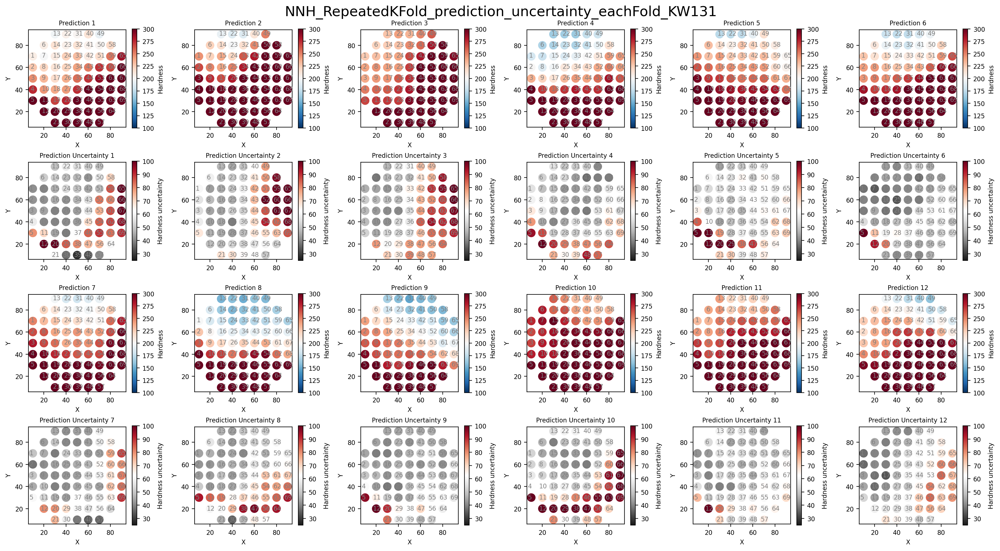

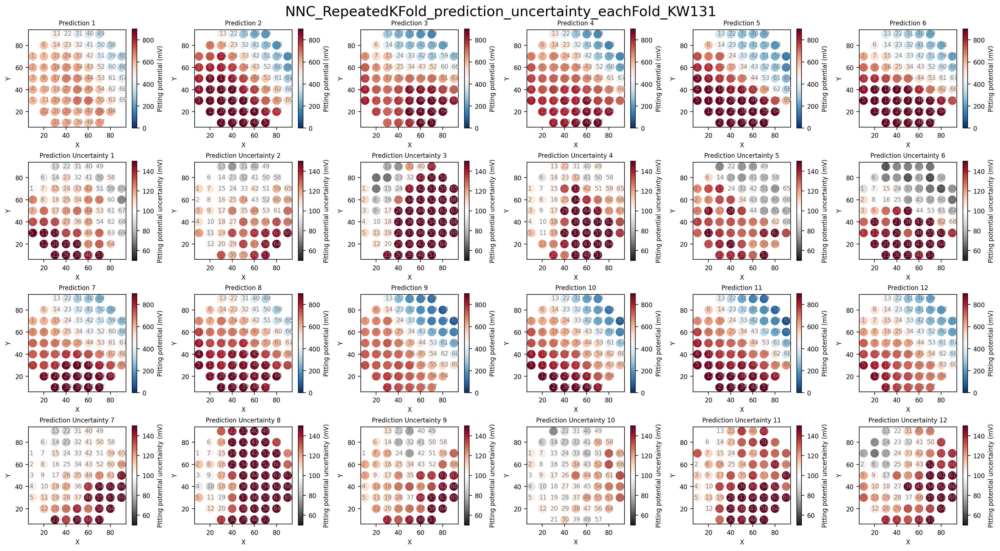

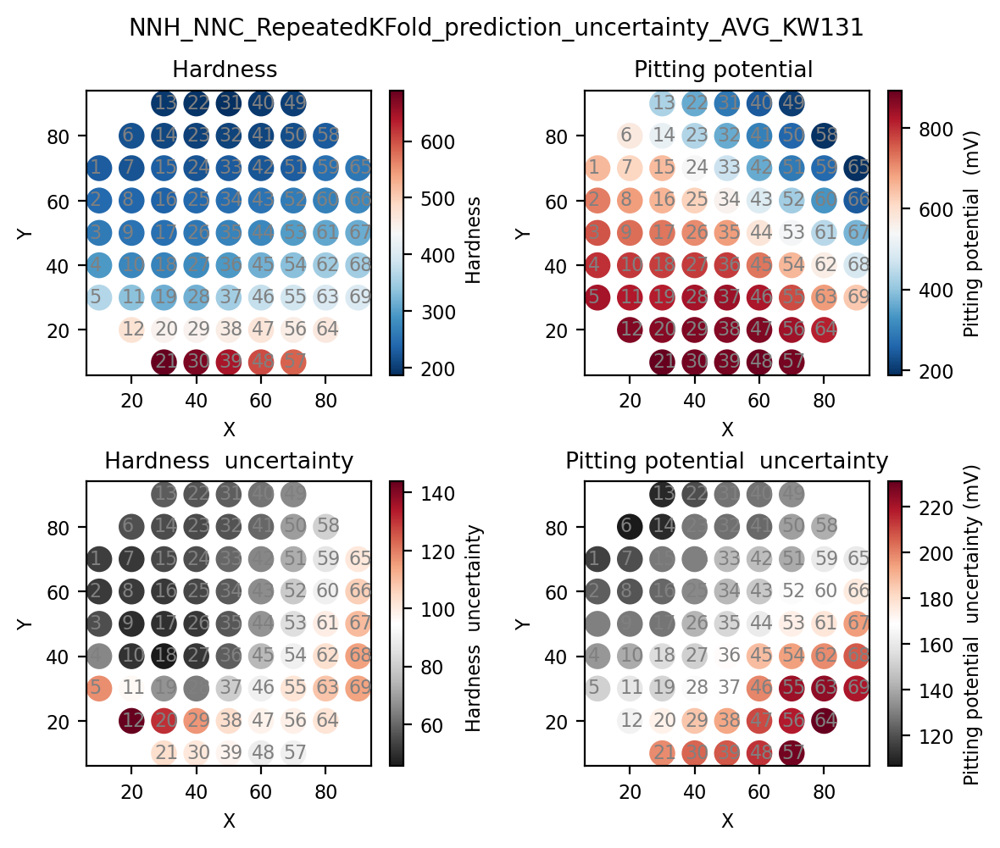

Processing: 100%|██████████| 2/2 [02:00<00:00, 60.26s/it]


In [36]:
from utils.postprocessing_prediction import read_new_data_feature_calc, predict_bootstrap_NNH_NNC, plot_prediction_uncertainty, plot_prediction_uncertainty_AVG
from tqdm import tqdm

compo_A_B_C_D_E_list = [['Ni', 'Cr', 'Co', 'V', 'Fe'],
                        ['Ni', 'Cr', 'Mo', 'Ti', 'Fe']]
compo_A_B_C_D_E_fname_list = ['KW99',
                              'KW131']

for compo_A_B_C_D_E, compo_A_B_C_D_E_fname in tqdm(zip(compo_A_B_C_D_E_list, compo_A_B_C_D_E_fname_list), desc='Processing', total=len(compo_A_B_C_D_E_list)):

    print(compo_A_B_C_D_E)
    print(compo_A_B_C_D_E_fname)
    vars_ele = compo_A_B_C_D_E
    KW_name = compo_A_B_C_D_E_fname

    file_name_input = f'{data_path_KW}v6_{KW_name}_SSS_FCC_byCompo_wt_pct.xlsx'
    df_new_wt = pd.read_excel(file_name_input)

    compo_new, HC_specific_features, C_specific_testing = read_new_data_feature_calc(df_new_wt, vars_ele,
                                                                                     specific_features_sel_column=['delta_a', 'Tm', 'sigma_Tm',
                                                                                                                   'Hmix', 'sigma_Hmix', 'sigma_elec_nega', 'VEC', 'sigma_VEC'],
                                                                                     C_testing=np.array([25, 1, 7, 0.333]))

    NNH_model_name = 'NNH_model_RepeatedKFold_{}.h5'
    NNC_model_name = 'NNC_model_RepeatedKFold_{}.h5'
    k_folds, n_CVrepeats, mc_repeat = 6, 2, 100

    (H1_new_pred_stack, H1_new_pred_mean, H1_new_pred_std,
     C2_new_pred_stack, C2_new_pred_mean, C2_new_pred_std) = predict_bootstrap_NNH_NNC(
        model_path_bo, NNH_model_name, NNC_model_name,
        compo_new, HC_specific_features, C_specific_testing,
        scalers, k_folds, n_CVrepeats, mc_repeat)

    # Concatenate and compute mean and std + save to excel
    H1_new_pred_KFold_mean = np.mean(np.concatenate(
        H1_new_pred_stack, axis=0), axis=0).reshape(-1)
    H1_new_pred_KFold_std = np.std(np.concatenate(
        H1_new_pred_stack, axis=0), axis=0).reshape(-1)
    C2_new_pred_KFold_mean = np.mean(np.concatenate(
        C2_new_pred_stack, axis=0), axis=0).reshape(-1)
    C2_new_pred_KFold_std = np.std(np.concatenate(
        C2_new_pred_stack, axis=0), axis=0).reshape(-1)

    df_new_wt['H1_new_pred_KFold_mean'] = H1_new_pred_KFold_mean
    df_new_wt['H1_new_pred_KFold_std'] = H1_new_pred_KFold_std
    df_new_wt['C2_new_pred_KFold_mean'] = C2_new_pred_KFold_mean
    df_new_wt['C2_new_pred_KFold_std'] = C2_new_pred_KFold_std

    file_name_output = f'{data_path_KW}v6_{KW_name}_SSS_FCC_byCompo_wt_pct_ML.xlsx'
    df_new_wt.to_excel(file_name_output, index=False)

    # NNH predictions
    plot_prediction_uncertainty(data_path_KW, coord_x, coord_y, index_PVD_x_y, H1_new_pred_mean, H1_new_pred_std,
                                pred_label='Hardness', unc_label='Hardness uncertainty',
                                title='NNH_RepeatedKFold_prediction_uncertainty_eachFold_' + KW_name,
                                vmin1=100, vmax1=300,
                                vmin2=25, vmax2=100)

    # NNC predictions
    plot_prediction_uncertainty(data_path_KW, coord_x, coord_y, index_PVD_x_y, C2_new_pred_mean, C2_new_pred_std,
                                pred_label='Pitting potential (mV)', unc_label='Pitting potential uncertainty (mV)',
                                title='NNC_RepeatedKFold_prediction_uncertainty_eachFold_' + KW_name,
                                vmin1=0, vmax1=900,
                                vmin2=50, vmax2=150)

    # NNH_NNC_AVG predictions
    plot_prediction_uncertainty_AVG(data_path_KW, coord_x, coord_y, index_PVD_x_y, H1_new_pred_stack, C2_new_pred_stack,
                                    title='NNH_NNC_RepeatedKFold_prediction_uncertainty_AVG_' + KW_name)